In [90]:
import numpy as np
import cv2
import os
import glob
import time
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label


In [33]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [34]:
def bin_spatial(img, size=(32, 32)):
    color1=cv2.resize(img[:,:,0],size).ravel()
    color2=cv2.resize(img[:,:,1],size).ravel()
    color3=cv2.resize(img[:,:,2],size).ravel()

    return np.hstack((color1,color2,color3))

In [35]:
def color_hist(img, nbins=32):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [36]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32,orient=9,pix_per_cell=8, cell_per_block=2,hog_channel=0,
                    spatial_feat=True, hist_feat=True,hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features=[]
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      
        # Apply bin_spatial() to get spatial color features
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        # Apply color_hist() also with a color space option now
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        #Call get_hog_features() with vis=False, feature_vec = True
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                        hog_features.append(get_hog_features(feature_image[:,:,channel],orient, pix_per_cell,
                                                            cell_per_block, vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:       
                hog_features.append(get_hog_features(feature_image[:,:,hog_channel],orient, pix_per_cell,
                                                            cell_per_block, vis=False, feature_vec=True))
            file_features.append(hog_features)
        
        # Append the new feature vector to the features list
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [37]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [40]:
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

In [38]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return draw_img

In [84]:
def car_detection(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    heatmap = np.zeros_like(img[:,:,0])
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv = "RGB2YCrCb")
    if scale !=1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    #define blocks and steps as above
    nxblocks = (ch1.shape[1]//pix_per_cell) -1
    nyblocks = (ch1.shape[0]//pix_per_cell) -1
    nfeat_per_block =orient *cell_per_block**2
    window = 64
    nblocks_per_window = (window //pix_per_cell) -1
    cells_per_step = 2 #instead of overlap, define #of cell to step
    nxsteps = (nxblocks -nblocks_per_window)// cells_per_step
    nysteps = (nyblocks -nblocks_per_window)// cells_per_step
    
    #compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block,feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block,feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block,feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            #extract HOG for this section
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1,hog_feat2,hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            #extract the images 
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window],(64,64))
            
            #Get color features
            spatial_features = bin_spatial(subimg, size = spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            #Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features,hist_features, hog_features)).reshape(1,-1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction ==1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left,ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,225),6)
                img_boxes.append(((xbox_left,ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw]+=1
                
    return  draw_img, heatmap

In [41]:
#display images for visualization in ipython notebook
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows,cols,i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap = "hot")
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])

In [53]:
## use to test for single image

def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32,orient=9,pix_per_cell=8, cell_per_block=2,hog_channel=0,
                    spatial_feat=True, hist_feat=True,hog_feat=True, vis =False):
    # Create a list to append feature vectors to
    # Iterate through the list of images
    img_features=[]
    # Read in each one by one
    image = img
    # apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)      
    # Apply bin_spatial() to get spatial color features
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        img_features.append(spatial_features)
    # Apply color_hist() also with a color space option now
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        img_features.append(hist_features)
    #Call get_hog_features() with vis=False, feature_vec = True
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],orient, pix_per_cell,
                                                        cell_per_block, vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)
        else:

            hog_features, hog_image=get_hog_features(feature_image[:,:,hog_channel],orient, pix_per_cell,
                                                        cell_per_block, vis=True, feature_vec=True)

        img_features.append(hog_features)

    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)


In [68]:
def convert_color (img, conv = "RGB2YCrCb"):
    if conv == "RGB2YCrCb":
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == "BGR2YCrCb":
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == "RGB2LUV":
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

In [78]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

In [79]:
def draw_labeled_bboxes(img, labels):

    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

In [109]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

In [43]:
#load in training data
cars =[]
noncars =[]

car_path = 'data/vehicles/'
noncar_path = 'data/non-vehicles/'

car_dir = os.listdir(car_path)
noncar_dir = os.listdir(noncar_path)

#create file with images path and put all images to list
for folder in car_dir:
    cars.extend(glob.glob(car_path+folder+"/*"))
with open("cars.txt", 'w') as f:
    for fn in cars:
        f.write(fn+'\n')
    
for folder in noncar_dir:
    noncars.extend(glob.glob(noncar_path+folder+"/*"))
with open("noncars.txt", 'w') as f:
    for fn in noncars:
        f.write(fn+'\n')
        
print("number of data for cars: ", len(cars))
print("number of data for non cars: ", len(noncars))

number of data for cars:  8792
number of data for non cars:  8968


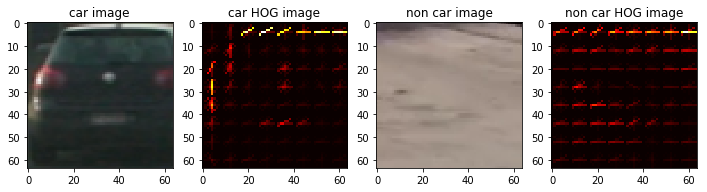

In [222]:
## display HOG images compare to origin 

#choose random car / non car indices
car_ind = np.random.randint(0,len(cars))
noncar_ind = np.random.randint(0,len(noncars))

#Read in car / non car images
car_image = mpimg.imread(cars[car_ind])
noncar_image = mpimg.imread(noncars[noncar_ind])

#Define deature parameters
color_space = "YCrCb"
orient =6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 
spatial_size = (16, 16)
hist_bins =16
spatial_feat = True
hist_feat = True
hog_feat = True

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins,orient=orient,pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,hog_channel=hog_channel,
                    spatial_feat=spatial_feat,hist_feat=hist_feat,hog_feat=hog_feat,vis=True)

noncar_features, noncar_hog_image = single_img_features(noncar_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins,orient=orient,pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,hog_channel=hog_channel,
                    spatial_feat=spatial_feat, hist_feat=hist_feat,hog_feat=hog_feat,vis=True)

images = [car_image, car_hog_image, noncar_image, noncar_hog_image]
titles = ["car image", "car HOG image", "non car image", "non car HOG image"]
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)
fig.savefig("./output_images/HOG_sample2.jpg")

In [223]:
## Train Classifier
color_space = "YCrCb" # RGB, HSV, LUV, HLS, YUV, YCrCb
orient =9 
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # can try 0 , 1 ,2 or ALL
spatial_size = (32,32)
hist_bins =32
spatial_feat = True
hist_feat = True
hog_feat = True

t=time.time()
# n_samples =1000
# random_idxs = np.random.randint(0,len(cars),n_samples)
# test_cars = np.array(cars)[random_idxs]
# test_noncars = np.array(noncars)[random_idxs]
test_cars = cars
test_noncars = noncars


car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins,orient=orient,pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                        hog_channel=hog_channel,spatial_feat=spatial_feat,hist_feat=hist_feat,hog_feat=hog_feat)

noncar_features = extract_features(test_noncars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins,orient=orient,pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                        hog_channel=hog_channel,spatial_feat=spatial_feat,hist_feat=hist_feat,hog_feat=hog_feat)


print(time.time()-t, "seconds to compute features....")

X = np.vstack((car_features,noncar_features)).astype(np.float64)
#fit a per-column scaler
X_scaler = StandardScaler().fit(X)
#apply the scaler to X
scaled_X = X_scaler.transform(X)

#define the labels vector
y = np.hstack((np.ones(len(car_features)),np.zeros(len(noncar_features))))

rand_state = np.random.randint(0,100)
X_train, X_test, Y_train, Y_test = train_test_split(scaled_X, y, test_size=0.1, random_state = rand_state)

print('Using: ', orient, 'orientations, ', pix_per_cell,
      'pixels per cell, ', cell_per_block, 'cells per block, ',
      hist_bins, 'histogram bins, and ', spatial_size, 'spatial sampling')
print("Feature vector length: ", len(X_train[0]))
# use a linear SVC
svc = LinearSVC(C=0.01)
#check the training time for the SVC
t=time.time()
svc.fit(X_train,Y_train)

print(round(time.time()-t, 2), "Seconds to train SVC")
#check the score of the SVC
print("Test Accuracy of SVC = ", round(svc.score(X_test,Y_test),4))

151.66959691047668 seconds to compute features....
Using:  9 orientations,  8 pixels per cell,  2 cells per block,  32 histogram bins, and  (32, 32) spatial sampling
Feature vector length:  8460
154.82 Seconds to train SVC
Test Accuracy of SVC =  0.9927


0.0 1.0
1.511819839477539  seconds to process one image searching 273 windows
0.0 1.0
1.4657528400421143  seconds to process one image searching 273 windows
0.0 1.0
1.4691150188446045  seconds to process one image searching 273 windows
0.0 1.0
1.5202181339263916  seconds to process one image searching 273 windows
0.0 1.0
1.7534031867980957  seconds to process one image searching 273 windows
0.0 1.0
1.4178581237792969  seconds to process one image searching 273 windows


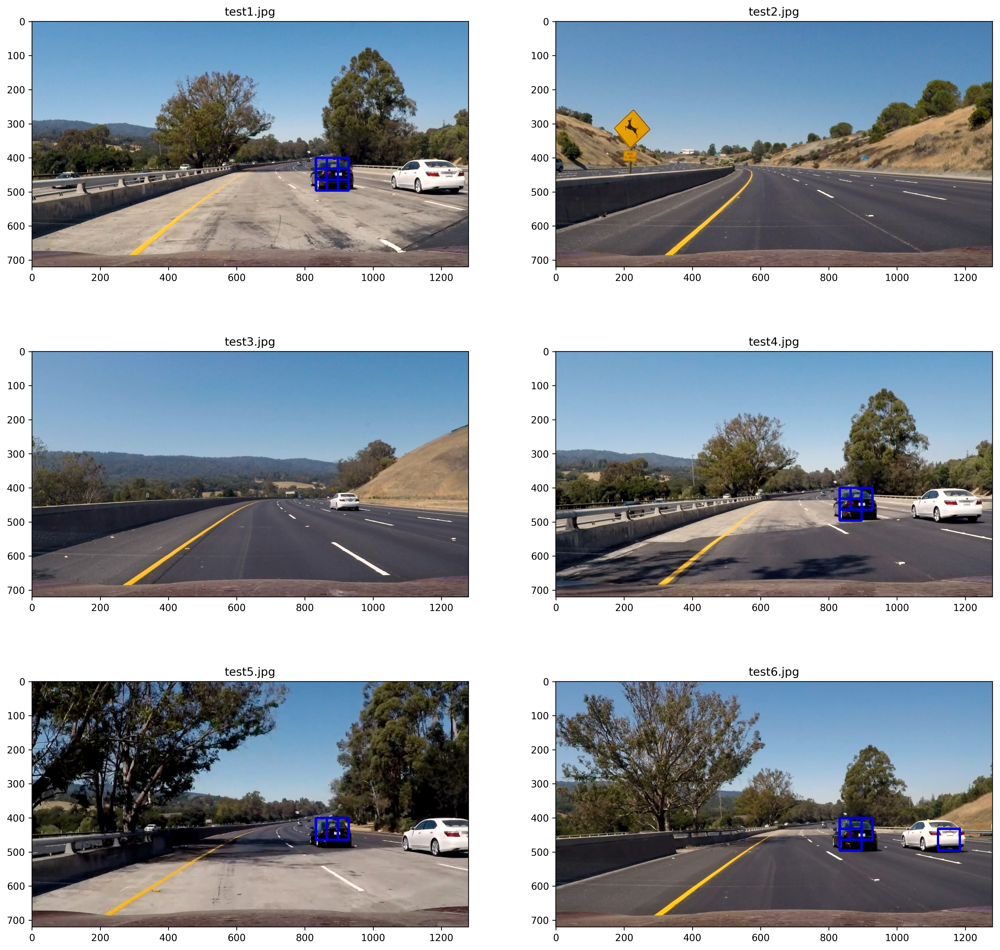

In [67]:
test_path = "./test_images/*"
test_dir = glob.glob(test_path)
images=[]
titles=[]
y_start_stop = [400,656] # min and max in y to search in slide_window()
overlap = 0.5 #window overlap

for img_dir in test_dir:
    img_title = img_dir.rsplit('/')[-1]
    
    t1 = time.time()
    img = mpimg.imread(img_dir)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
#     print(np.min(img), np.max(img))
    
    windows = slide_window(img, x_start_stop=[None,None],y_start_stop=y_start_stop,
                          xy_window=(64,64),xy_overlap=(overlap,overlap)
    
    
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space, 
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                    hog_channel=hog_channel, spatial_feat=spatial_feat, 
                    hist_feat=hist_feat, hog_feat=hog_feat)
    
    window_img = draw_boxes(draw_img, hot_windows, color=(0,0,225), thick =6)
    images.append(window_img)
    titles.append(img_title)
    print(time.time()-t1, " seconds to process one image searching", len(windows), "windows")
fig = plt.figure(figsize= (18,18), dpi =300)
visualize(fig, 3, 2, images, titles)
fig.savefig('./output_images/test_img5.jpg', dpi=fig.dpi)

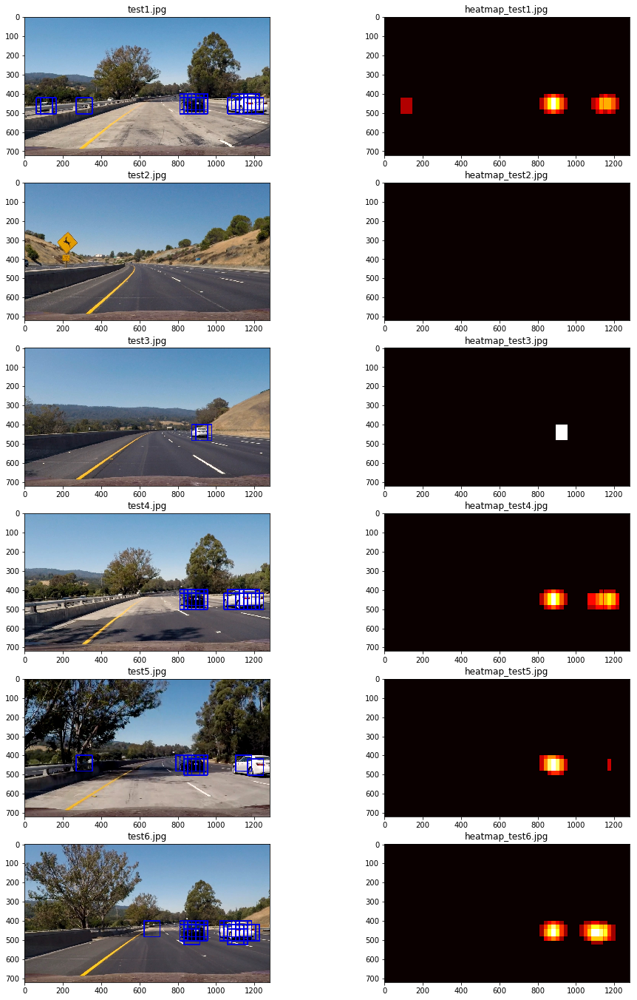

In [224]:
#testing 

out_images = []
combine_box = []
out_titles = []


ystart =400
ystop = 650
scale=1.3
for img_dir in test_dir:
    img_title = img_dir.rsplit('/')[-1]
    img = mpimg.imread(img_dir)
    draw_img, heatmap = car_detection(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    
    heatmap = apply_threshold(heatmap, 1)
    
    out_images.append(draw_img)
    out_images.append(heatmap)
    
    out_titles.append((img_title))
    out_titles.append(("heatmap_"+img_title))
    
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    combine_box.append(draw_img)
    combine_box.append(heatmap)
    
fig = plt.figure(figsize = (16,24))
visualize(fig, 6, 2, out_images, out_titles)
fig.savefig('./output_images/test_img_C1.jpg', dpi=fig.dpi)

# fig = plt.figure(figsize = (16,24))
# visualize(fig, 6, 2, combine_box, out_titles)
# fig.savefig('./output_images/test_img_heatmap_onebox.jpg', dpi=fig.dpi)

In [211]:
previous = []
def video_process(img):
    global previous
    y_start_stop = [400,650]
    scale = 1.5
    draw_img, heatmap = car_detection(img, y_start_stop[0], y_start_stop[1], scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins)
    #store previous image 
    previous.append(heatmap)
    previous = previous[-20:]
    
    heat_map = np.zeros_like(img[:, :, 0]).astype(np.float)/255
    heat_map = add_heat(heatmap, [heatmap for heatmap in previous])
    heat_map = apply_threshold(heat_map, 1)
#     plt.imshow(heat_map,cmap='hot')
    
    labels = label(heat_map)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img
    

In [212]:
test_output = "test_video_output.mp4"
clip1 = VideoFileClip("test_video.mp4")
clip1_output = clip1.fl_image(video_process)
%time clip1_output.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


 97%|█████████▋| 38/39 [00:17<00:00,  2.14it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

CPU times: user 16.6 s, sys: 938 ms, total: 17.5 s
Wall time: 19.8 s


In [213]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_output))

In [214]:
video_output = "project_video_output.mp4"
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(video_process)
%time clip1_output.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [10:50<00:00,  2.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 9min 43s, sys: 33.2 s, total: 10min 16s
Wall time: 10min 52s


In [215]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))